In [1]:
# Note: some of the code are copied from Kaggle's lessons

# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
from scipy import signal
# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('./'):
    for filename in filenames:
#         print(os.path.join(dirname, filename))
        pass

# You can write up to 5GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All" 
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [2]:
from sklearn.model_selection import train_test_split

from sklearn.metrics import mean_absolute_error
from sklearn.compose import ColumnTransformer
from sklearn.pipeline import Pipeline
from sklearn.impute import SimpleImputer
from sklearn.preprocessing import OneHotEncoder
from sklearn.feature_selection import SelectFromModel
from sklearn.neural_network import MLPRegressor

from sklearn.ensemble import RandomForestRegressor
from xgboost import XGBRegressor
import lightgbm as lgb

import tensorflow as tf
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras import callbacks

import matplotlib as mpl
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns

In [3]:
# Files 
GSPC_path='./data/^GSPC.csv'
can_unemp_path='./data/can_unempemp.csv'
us_unemp_path='./data/us_UNRATE.csv'
DJI_path='./data/^DJI.csv'
FVX_path='./data/^FVX.csv'
GSPTSE_path='./data/^GSPTSE.csv'
IRX_path='./data/^IRX.csv'
IXIC_path='./data/^IXIC.csv'
N225_path='./data/^N225.csv'
TNX_path='./data/^TNX.csv'
TYX_path='./data/^TYX.csv'
usGDP_path='./data/usGDP.csv'
non_farm_path='./data/non_farm.csv'
us_CPI_path='./data/OECD_CPI_Total_All_Items.csv'

In [4]:
GSPC = pd.read_csv(GSPC_path, index_col='Date',parse_dates=True)
can_unemp = pd.read_csv(can_unemp_path, index_col='Date',parse_dates=True)
us_unemp = pd.read_csv(us_unemp_path, index_col='DATE',parse_dates=True)

DJI = pd.read_csv(DJI_path, index_col='Date',parse_dates=True)
FVX = pd.read_csv(FVX_path, index_col='Date',parse_dates=True)
GSPTSE = pd.read_csv(GSPTSE_path, index_col='Date',parse_dates=True)
IRX = pd.read_csv(IRX_path, index_col='Date',parse_dates=True)
IXIC = pd.read_csv(IXIC_path, index_col='Date',parse_dates=True)
N225 = pd.read_csv(N225_path, index_col='Date',parse_dates=True)
TNX = pd.read_csv(TNX_path, index_col='Date',parse_dates=True)
TYX = pd.read_csv(TYX_path, index_col='Date',parse_dates=True)

usGDP = pd.read_csv(usGDP_path, index_col='DATE',parse_dates=True)
non_farm = pd.read_csv(non_farm_path, index_col='DATE',parse_dates=True)
us_CPI = pd.read_csv(us_CPI_path, index_col='DATE',parse_dates=True)


In [5]:
def stock_use_close_value(df):
    headers_to_drop=['Open', 'High','Low','Adj Close','test','Volume']
    current_cols=df.columns
#     df['Close-Open']=df['Close']-df['Open']
    for header in headers_to_drop:
        if header in current_cols:
            df=df.drop(columns = header)
    if 'Close' in current_cols:
        pass
#         df['Close']=df['Close'].apply(np.log)
    return df


def data_prepare(df,name):
    df=df.dropna()
    df=df.resample('D').interpolate(method='cubic') #TODO: possible data leak
    
    for col in df.columns:
        df=df.rename(columns={col : (name+'_'+col)})
    return df


In [6]:
GSPC=data_prepare(stock_use_close_value(GSPC),'GSPC')
can_unemp=data_prepare(can_unemp,'can_unemp')
us_unemp=data_prepare(us_unemp,'us_unemp')

DJI=data_prepare(stock_use_close_value(DJI),'DJI')
FVX=data_prepare(stock_use_close_value(FVX),'FVX')
GSPTSE=data_prepare(stock_use_close_value(GSPTSE),'GSPTSE')
IRX=data_prepare(stock_use_close_value(IRX),'IRX')
IXIC=data_prepare(stock_use_close_value(IXIC),'IXIC')
N225=data_prepare(stock_use_close_value(N225),'N225')
TNX=data_prepare(stock_use_close_value(TNX),'TNX')
TYX=data_prepare(stock_use_close_value(TYX),'TYX')

usGDP=data_prepare(usGDP,'usGDP')
non_farm=data_prepare(non_farm,'non_farm')
us_CPI=data_prepare(us_CPI,'us_CPI')




econ_data_ori=GSPC.copy()
# econ_data_ori=econ_data_ori.join(can_unemp)
econ_data_ori=econ_data_ori.join(us_unemp)
econ_data_ori=econ_data_ori.join(DJI)
# econ_data_ori=econ_data_ori.join(FVX)
# econ_data_ori=econ_data_ori.join(GSPTSE)
# econ_data_ori=econ_data_ori.join(IRX)
# econ_data_ori=econ_data_ori.join(IXIC)
econ_data_ori=econ_data_ori.join(N225)
# econ_data_ori=econ_data_ori.join(TNX)
# econ_data_ori=econ_data_ori.join(TYX)


# econ_data_ori=econ_data_ori.join(usGDP)
# econ_data_ori=econ_data_ori.join(non_farm)
# econ_data_ori=econ_data_ori.join(us_CPI)


current_time_features=econ_data_ori.columns
econ_data_ori

,GSPC_Close,us_unemp_UNRATE,DJI_Close,N225_Close
Date,,,,
1950-01-03,16.660000,6.484862,NaN,NaN
1950-01-04,16.850000,6.477920,NaN,NaN
1950-01-05,16.930000,6.471378,NaN,NaN
1950-01-06,16.980000,6.465225,NaN,NaN
1950-01-07,17.048521,6.459447,NaN,NaN
...,...,...,...,...
2019-09-13,3007.389893,NaN,27219.519531,21988.289063
2019-09-14,3002.211764,NaN,27195.178014,22239.241389
2019-09-15,2997.932843,NaN,27126.278833,22400.024966


In [7]:

def rolling_mean(series,duration):
    return (series.rolling(duration, win_type='blackman').mean())

def rolling_pstd(series,duration):
    cat = lambda x: (x - x.mean()) / x.std()   
    series=series.dropna()
    series=series.replace([np.inf, -np.inf], np.nan).fillna(series.mean())
    return (series.rolling(duration).std()/series*100).replace([np.inf, -np.inf], np.nan).fillna(series.mean())


def sp_cat(x):
    if (x > 4.0):
        return 2

    if (x> 1.0):
        return 1

    if (x > -1.0):
        return 0

    if (x >-4.0):
        return -1

    if (x <-4.0):
        return -2



def smooth_data(df, features_to_smooth, tap=10):
    for col in features_to_smooth:
        df[col+'_smoothed']=rolling_mean(df[col],tap).shift(periods=int(-tap/2))
    return df

def trend_predict(series, target_distance, sampling_period=30, order=1):
    
    series=series.dropna()
    
    list_of_values_in_window = []
    series.rolling(sampling_period).apply(lambda x: list_of_values_in_window.append(x.values) or 0, raw=False)
    slopes=[]
    for arr in list_of_values_in_window:
        simple_fit = (np.polyfit(range(sampling_period), arr, order))
        poly_func = np.poly1d(simple_fit)
        pred=poly_func(target_distance-1+sampling_period)
        slopes.append(pred)

    pred_series=pd.Series(slopes, (series.index[:1-sampling_period]))
    
    return pred_series
    
def inverted_in_past_duration(series_high,series_low,duration):
    series=series_high-series_low
    def min_is_negative (arr):
        min_val=np.min(arr)
        if min_val<=0:
            return 1
        else: return 0
    return (series.rolling(duration).apply(min_is_negative))

    
    return pred_series
def trendline(series, tap, name='slopes', order=1):
    series=series.dropna()
    series=series[series.notna()]
    start_date=series.first_valid_index()
    end_date=series.last_valid_index()

    series=series[series.index>=start_date]
    series=series[series.index<=end_date]
    
    list_of_values_in_window = []
    series.rolling(tap).apply(lambda x: list_of_values_in_window.append(x.values) or 0, raw=False)
      
    slopes = [(np.polyfit(range(tap), arr, order))[-2] for arr in list_of_values_in_window]

    slopes_series=pd.Series(slopes, (series.index[tap-1:]))

    return slopes_series

def stock_utility(series_list, name_list=[], delay_days=[],trendline_days=[], std_days=[]):
    df = pd.DataFrame()
    if not isinstance(series_list, pd.DataFrame):
        col_list=[0]
        series_list=[series_list]
    else:
        col_list= series_list.columns
        
    if not isinstance(name_list, list):
        name_list=[name_list]    
        
    if not isinstance(trendline_days, list):
        trendline_days=[trendline_days]  
        
    if not isinstance(std_days, list):
        std_days=[std_days]  
    
    
    for i in range(len(col_list)):
        series=series_list[col_list[i]].dropna()
        if i >= len(name_list):
            name = series.name
        else:
            name=name_list[i]
        print('stock_utility is working on '+name)
        
        for dd in delay_days:
            df[name+'_'+str(dd)+'d']=series.shift(periods=dd)

        for td in trendline_days:
            series_name=name+'_'+str(td)+'days_trendline'
            df[series_name]=trendline(series,td,series_name)

        for sd in std_days:
            series_name=name+'_'+str(sd)+'days_pSTD'
            df[series_name]=rolling_pstd(series,sd)

    return df

def poly_extrapolate (df,target_distance, sampling_period=[30], order=1):
    new_df = pd.DataFrame()
    if not isinstance(df, pd.DataFrame):
        col_list=[0]
        df=[df]
    else:
        col_list= df.columns
        
    if not isinstance(sampling_period, list):
        sampling_period=[sampling_period]  
        
    
    for i in range(len(col_list)):
        series=df[col_list[i]].dropna()
        name = series.name
        target_distance=[int(s) for s in str(name).replace('days','').replace('d','').split('_') if s.isdigit()][-1]
        print('extrapolating '+name)

        for sp in sampling_period:
            series_name=name+'_'+str(sp)+'days_'+str(order)+'order_extrapolated'
            new_df[series_name]=trend_predict(series, target_distance, sp, order)            

    return new_df

def p_diff_err (ref_series,diff_series):
    result=(abs(diff_series-ref_series)/ref_series).dropna().values.mean()*100
    print ('The absolut error is {:.3f}%'.format(result))
    return result

def diff_err_scorer (ref_series,diff_series):
    result=(((100*abs(diff_series-ref_series)/ref_series)**3)).dropna().values.mean()
    result=result**(0.5)
    print ('The custom error is {:.3f}'.format(result))
    return result

def normalize_stock (df,target_days,additional_features =[] ,key_word="Close", negative_keyword='STD'):
    features_to_norm = [f for f in df.columns if (key_word in f and negative_keyword not in f)]
    features_to_norm =list(features_to_norm) + additional_features
    features_to_norm = list(dict.fromkeys(features_to_norm))
    normed_features = [feature +'_'+str(target_days)+'days_ratio' for feature in features_to_norm]
    df[normed_features]=((df[features_to_norm]/df[features_to_norm].shift(periods=target_days))-1)*100
    return df

In [8]:
def data_init_wrapper (df, target_days, important_features=['GSPC_Close']):
    new_df= df.copy()
    ori_features=df.columns
    smoothed_features = [f for f in list(ori_features) if "smoothed" in f]
    not_important_std_features = [f for f in list(ori_features) if f not in (smoothed_features + important_features)]
    important_std_features = [f for f in list(ori_features) if (f not in smoothed_features and f in important_features)]
    print('not_important_std_features='+str(not_important_std_features))
    print('important_std_features='+str(important_std_features))
    
#     remove not smooth or not std features
    features_to_drop=[f for f in list(new_df.columns) if (("smoothed" not in f) and ("STD" not in f))]
    new_df=new_df.drop(columns=features_to_drop)

    target='GSPC_Close_smoothed_'+str(target_days)+'days_ratio'
    
    important_features.append(target)
    important_features=[f for f in important_features if f not in features_to_drop]
    
    additional_features_to_normalize=[]
    if 'non_farm_non_Farm_smoothed' in ori_features:
        additional_features_to_normalize.append('non_farm_non_Farm_smoothed')
    if 'usGDP_usGDP_smoothed' in ori_features:
        additional_features_to_normalize.append('usGDP_usGDP_smoothed')
    
    new_df=normalize_stock(new_df, target_days, additional_features=additional_features_to_normalize)

    trendline_features=list(new_df.columns)
    
    not_important_trendline_features=[f for f in list(trendline_features) if f not in (important_features)]
    important_trendline_features=[f for f in list(trendline_features) if f in (important_features)]
    
    new_df=new_df.join( stock_utility(new_df[not_important_trendline_features],trendline_days=[target_days]) )
    
    new_df=new_df.join(stock_utility(new_df[important_trendline_features],trendline_days=[target_days]))
    
    features_to_delay=list(new_df.columns)
    features_to_delay.remove(target)   
    
    output_df=stock_utility(new_df,delay_days=[target_days])
    
    features_to_add_extrapolation=[f for f in list(output_df.columns) if ('trendline' not in f)]
    
    order1_extrapolation=(poly_extrapolate(output_df[features_to_add_extrapolation],target_days, sampling_period=[30,target_days], order=1))
    output_df=output_df.join(poly_extrapolate(output_df[features_to_add_extrapolation],target_days, sampling_period=[30,target_days], order=2))
    output_df=output_df.join(order1_extrapolation)
    
    output_df=output_df.join(new_df[target])
    

    return output_df

In [9]:
econ_data=econ_data_ori.copy()
econ_data.name='econ_data'
prediction_distance=30

econ_data_file_path=econ_data.name+str(prediction_distance)+'.csv'
if not os.path.isfile(econ_data_file_path):
    # Add features
    econ_data=smooth_data(econ_data,current_time_features,prediction_distance)

    econ_data_processed = data_init_wrapper(econ_data, prediction_distance)
    econ_data=econ_data_processed
    
    econ_data.to_csv(econ_data_file_path)
else:
    econ_data = pd.read_csv(econ_data_file_path)
    econ_data["Date"]=pd.to_datetime(econ_data["Date"])
    econ_data=econ_data.set_index("Date").dropna()

target='GSPC_Close_smoothed_'+str(prediction_distance)+'days_ratio'



In [10]:
start_date=max(econ_data.apply(lambda series: series.first_valid_index()))
end_date=min(econ_data.apply(lambda series: series.last_valid_index()))

econ_data=econ_data[econ_data.index>=start_date]
econ_data=econ_data[econ_data.index<=end_date]

# econ_data.drop(index=pd.to_datetime('1950-01-03'))
econ_data

,GSPC_Close_smoothed_30d,us_unemp_UNRATE_smoothed_30d,DJI_Close_smoothed_30d,N225_Close_smoothed_30d,GSPC_Close_smoothed_30days_ratio_30d,DJI_Close_smoothed_30days_ratio_30d,N225_Close_smoothed_30days_ratio_30d,GSPC_Close_smoothed_30days_trendline_30d,us_unemp_UNRATE_smoothed_30days_trendline_30d,DJI_Close_smoothed_30days_trendline_30d,...,DJI_Close_smoothed_30days_ratio_30d_30days_2order_extrapolated,N225_Close_smoothed_30days_ratio_30d_30days_2order_extrapolated,GSPC_Close_smoothed_30d_30days_1order_extrapolated,us_unemp_UNRATE_smoothed_30d_30days_1order_extrapolated,DJI_Close_smoothed_30d_30days_1order_extrapolated,N225_Close_smoothed_30d_30days_1order_extrapolated,GSPC_Close_smoothed_30days_ratio_30d_30days_1order_extrapolated,DJI_Close_smoothed_30days_ratio_30d_30days_1order_extrapolated,N225_Close_smoothed_30days_ratio_30d_30days_1order_extrapolated,GSPC_Close_smoothed_30days_ratio
Date,,,,,,,,,,,,,,,,,,,,,
1985-05-12,180.135630,7.258506,1263.432438,12504.594130,1.084040,0.159876,0.663794,0.075174,0.000083,0.108545,...,4.367559,16.699373,184.197018,7.194505,1253.214839,12592.193215,0.980376,-1.049333,-1.519984,2.417418
1985-05-13,180.310349,7.254004,1264.235975,12474.547361,1.267848,0.332210,0.327173,0.075135,-0.000263,0.109952,...,7.567461,15.826054,184.948707,7.213037,1256.649011,12649.534056,1.342346,-0.806145,-0.683113,2.618438
1985-05-14,180.484143,7.249466,1265.064009,12442.258137,1.418733,0.472873,-0.037297,0.074569,-0.000607,0.108356,...,10.495903,14.989269,185.835453,7.232582,1261.086314,12699.449690,1.792612,-0.471236,0.158284,2.810354
1985-05-15,180.649737,7.244937,1265.878303,12409.198008,1.532861,0.578870,-0.411659,0.073692,-0.000947,0.105797,...,13.075423,14.329897,186.844400,7.252997,1266.475189,12741.077852,2.318908,-0.055157,0.994135,2.991489
1985-05-16,180.801631,7.240457,1266.647022,12377.073663,1.609080,0.650003,-0.776609,0.072692,-0.001279,0.104088,...,15.250301,13.952044,187.957621,7.274138,1272.741193,12774.060282,2.906913,0.430102,1.815814,3.159806
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2019-06-14,2850.388563,3.651233,25697.084984,21288.516373,-1.838279,-2.784759,-3.547604,-2.058964,0.002837,-30.062312,...,40.628076,35.534528,2873.086030,3.780235,26008.649793,20474.697417,1.409297,3.462181,-1.412919,1.577011
2019-06-15,2847.794929,3.654743,25681.505533,21265.827790,-1.976097,-2.909168,-3.791328,-2.427807,0.002937,-32.666607,...,42.177359,37.681412,2898.530185,3.776408,26228.911532,20587.819032,2.937690,4.899860,0.032666,1.856410
2019-06-16,2845.555063,3.658209,25670.003821,21249.163202,-2.107802,-3.015386,-3.992732,-2.774381,0.003026,-34.884723,...,42.733482,38.843786,2924.080189,3.772366,26452.939665,20704.603112,4.450287,6.299449,1.421672,2.116534


In [11]:
econ_data=econ_data.dropna()
# econ_data=econ_data.astype(np.float32)

valid_fraction = 0.1
valid_size = int(len(econ_data) * valid_fraction)

# valid_size=365

# train = econ_data[:-1* 365]
# valid = econ_data[-365:]

econ_data=econ_data.round(10)
econ_data.fillna(0)
econ_data=econ_data.replace(np.inf, 1e10)
econ_data=econ_data.replace(-np.inf, -1e5)



for col in econ_data.columns:
    a = np.array(econ_data[col].values.tolist())
    econ_data[col] = np.where(a > 1e10, 1e10, a).tolist()
    


train = econ_data[:-2*valid_size]
valid = econ_data[-2 * valid_size:-valid_size]
test = econ_data[-valid_size:]

feature_cols = train.columns.drop(target)


X_train=train[feature_cols]
y_train=train[target]


X_valid=econ_data[-2 * valid_size:][feature_cols]
y_valid=econ_data[-2 * valid_size:][target]


X_val=valid[feature_cols]
y_val=valid[target]

X_test=test[feature_cols]
y_test=test[target]

In [12]:
def local_extrema (series, tap=30):
    
#     series=rolling_mean(series,tap)
    series=series.dropna()
    
    index_of_maxima=[]
    index_of_minima=[]
    take_derivative=1
    while take_derivative==1:
        try:
            derivative = trendline(series, tap)*1000
            take_derivative=0
        except:
            pass
        
        
    
    def find_intercept (x):
        arr=x
        if max(arr)>0.02 and min(arr)<-0.02:
            last_val=arr[0]
            last_i=arr.index[0]
            for current_val, i in zip(arr[1:], arr.index[1:]):
                if last_val >0 and current_val <= 0:
                    return (i.value)
                if last_val <0 and current_val >= 0:
                    return (i.value)
                last_val=current_val
                last_i=i
        return float("NaN")

    list_of_values_in_window = []
    extrema=derivative.rolling(tap).apply(find_intercept).dropna()
    
    extrema = pd.to_datetime(list(dict.fromkeys(list(extrema.values))))

    extrema = [extremum for extremum in extrema 
               if abs(1-(series[extremum]/series[(extremum-pd.Timedelta(days=tap/2)):(extremum+pd.Timedelta(days=tap/2))].mean()))>0.003]

    return pd.to_datetime(extrema)


def extrema_shifts (ref_series_extrema,test_series_extrema, exclude_limit=60, soothing_period=15):
    
    def smother (date_series,soothing_period=soothing_period):
        date_series=date_series[pd.notnull(date_series)]
        day_diff=(date_series[1:]-date_series[:-1]).days
        index_days_too_close=[i for i in range(len(day_diff)) if day_diff[i]<=10 ]
        new_series = date_series
        for i in index_days_too_close:
            base_index=i
            while pd.isnull(new_series[base_index]):
                base_index=base_index-1
            new_series.values[base_index]=new_series[base_index]+(new_series[i+1]-new_series[base_index])/2
            new_series.values[i+1]=""
            
#         output=extrema_shifts_days.sort_index(axis=0)
#         output[pandas.notnull(output.values)]
        return new_series[pd.notnull(new_series)]
    ref_series_extrema=smother(ref_series_extrema)
    test_series_extrema=smother(test_series_extrema)
    extrema_shifts_days=pd.Series(dtype='float64')
    
    for extreme_date in ref_series_extrema:
        days_diff=([(extreme_date - test_extreme) for test_extreme in test_series_extrema])
        lowest_diff=days_diff[0]
#         print(days_diff)
        for diff in days_diff:
            if abs(diff)<abs(lowest_diff):
                lowest_diff=diff
        if abs(lowest_diff)<=pd.Timedelta(exclude_limit,'D'):
            extrema_shifts_days.at[extreme_date]=lowest_diff

    return extrema_shifts_days.sort_index(axis=0).dropna()


In [13]:
# arch=(14,14,14,7,7,7,5,5,5) # ~1.007/0.6008
# arch=(14,14,14,14,7,7,7,7,7,7,5,5) # ~0.662/1.10
# arch=(14,14,14,14,7,7,7,7,7,7,7,7,7,7,7,7,7,7,3) # ~0.619/0.824
arch=(14,14,14,7,7,7,7,7,7,7,7,7,7,7,7,7,7,7,3,3) # ~0.666/0.599

mlp_sklearn_model = MLPRegressor(random_state=1, max_iter=500, hidden_layer_sizes=arch).fit(X_train, y_train)
mlp_sklearn_preds = mlp_sklearn_model.predict(X_valid)
mlp_sklearn_score = mean_absolute_error(y_valid, mlp_sklearn_preds)

print('Train MAE:', mean_absolute_error(y_train, mlp_sklearn_model.predict(X_train)))
print('Valid MAE:', mlp_sklearn_score)


Train MAE: 0.6477031200255036
Valid MAE: 0.6667486399168836


In [14]:
# arch=[]
# max_width=28
# min_width=3
# width_step=2
# patience=3

# max_layers=30

# errs={}
# err_last_layer_num=1000

# for layer_num in range(1,max_layers+1):
#     layer_patience_level=patience+0
#     errs[layer_num]={}
#     print(f"working on layer {layer_num}....")
#     best_err=1000
#     best_width=0
#     current_patience_level=patience+0
#     for new_width in range(min_width,max_width+1,width_step):
#         current_arch=arch.copy()
#         current_arch.append(new_width)
#         current_arch=tuple(current_arch)
#         print(f"trying {current_arch}...")
#         mlp_sklearn_model = MLPRegressor(random_state=1, max_iter=500, hidden_layer_sizes=current_arch).fit(X_train, y_train)
#         mlp_sklearn_preds = mlp_sklearn_model.predict(X_valid)
#         mlp_sklearn_score = mean_absolute_error(y_valid, mlp_sklearn_preds)
#         print(f"Got {mlp_sklearn_score} for {current_arch}")
        
#         errs[layer_num][new_width]=mlp_sklearn_score
        
#         if errs[layer_num][new_width]<best_err:
#             best_err=errs[layer_num][new_width]
#             best_width=new_width
            
#         else:
#             current_patience_level=current_patience_level-1
#         if current_patience_level<0:
#             print("ran out of patience, skipping...")
#             break
# #     best_err=1000
# #     best_width=0
# #     for width in errs[layer_num]:
# #         if errs[layer_num][width]<best_err:
# #             best_err=errs[layer_num][width]
# #             best_width=width
    
#     if best_err<=err_last_layer_num:
#         print(f"choose {best_width} as the width of layer {layer_num}")
#         print("\n")
#         arch.append(best_width)
#         err_last_layer_num=best_err
#     else:
#         layer_patience_level=layer_patience_level-1
#         if layer_patience_level<0:
#             print("ran out of patience, finishing...")
#             print(arch)
#             break



In [15]:
def adjust_slope (series):
    series=series-series[0]
    slope=series[-1]/len(series)
    for i in range(len(series)):
        series[i]=series[i]-i*slope
    return series

def local_extrema (series, tap=30, dist=30/2):
    series=adjust_slope(series)
    peaks, full_result = signal.find_peaks(series, height=(None, None),width=1,distance=dist)
    return pd.to_datetime(series.index[peaks])

def extrema_shifts (ref_series_extrema,test_series_extrema, exclude_limit=60):
    ref_series_extrema=np.array(ref_series_extrema)
    test_series_extrema=np.array(test_series_extrema)
    
    closest_ind=abs(ref_series_extrema[:, None] - test_series_extrema[None, :]).argmin(axis=-1)
    
    out_obj={}
    
    for i in closest_ind:
        lowest_pos=abs(ref_series_extrema[closest_ind==i] - test_series_extrema[i]).argmin(axis=-1)
        lag=-1*(ref_series_extrema[closest_ind==i][lowest_pos]-test_series_extrema[i]) / np.timedelta64(1, 'D')
        if lag <= exclude_limit:
            out_obj[str(ref_series_extrema[closest_ind==i][lowest_pos])[:10]]=lag
            
    out_df=pd.Series(out_obj, name = 'Days Delayed').to_frame()
    print(f"The average delay around the peaks are {round(out_df['Days Delayed'].mean(),3)} days")
    print(f"The median delay around the peaks are {round(out_df['Days Delayed'].median(),3)} days")
    display(out_df)
    return out_df


def plot_results(model, X_valid, y_valid, start_time='2017-01-01', end_time='2020-01-03',\
                       econ_data_ori=econ_data_ori,prediction_distance=prediction_distance):
    
    preds=model.predict(X_valid)
    
    return plot_preds_results(preds, y_valid, start_time=start_time, end_time=end_time,\
                       econ_data_ori=econ_data_ori,prediction_distance=prediction_distance)

def plot_preds_results(preds, y_valid, start_time='2017-01-01', end_time='2020-01-03',\
                       econ_data_ori=econ_data_ori,prediction_distance=prediction_distance):
    
    valid_result=y_valid.to_frame()
    valid_result['preds']=preds

    plot_valid_result=valid_result

    plot_start_date= pd.to_datetime(start_time)
    plot_end_date= pd.to_datetime(end_time)

    plot_valid_result=plot_valid_result[plot_valid_result.index>=plot_start_date]
    plot_valid_result=plot_valid_result[plot_valid_result.index<=plot_end_date]


    sns.set_style("whitegrid")

    plt.figure(figsize=(11,8.5), dpi=600)

    sns.lineplot(data=plot_valid_result)

#     plt.show()


    plot_valid_result_new=plot_valid_result.copy()
    plot_valid_result_new['GSPC_Close_smoothed']=smooth_data(econ_data_ori,['GSPC_Close'],prediction_distance)['GSPC_Close_smoothed']
    plot_valid_result_new['GSPC_Close']=(econ_data_ori['GSPC_Close'])


    plot_valid_result_new['preds']=plot_valid_result_new['GSPC_Close_smoothed'].shift(periods=int(prediction_distance))*(plot_valid_result_new['preds']/100+1)

    plot_valid_result_new[target]=plot_valid_result_new['GSPC_Close_smoothed'].shift(periods=int(prediction_distance))*(plot_valid_result_new[target]/100+1)

    plot_valid_result_new=plot_valid_result_new.dropna()


    sns.set_style("whitegrid")

    p_diff_err(plot_valid_result_new[target], plot_valid_result_new['preds'])

#     diff_err_scorer(plot_valid_result_new[target], plot_valid_result_new['preds'])

    plt.figure(figsize=(11,8.5), dpi=600)


    plot_cols=plot_valid_result_new.loc[:, plot_valid_result_new.columns != target]
    plot_cols=plot_cols.columns

#     sns.lineplot(data=plot_valid_result_new.loc[:, plot_cols],hue_order=(['preds']+[ e for e in plot_cols if e is not 'preds' ]))
    sns.lineplot(data=plot_valid_result_new.loc[:, plot_cols],hue_order=([ e for e in plot_cols if e is not 'preds' ]+['preds']))

    valid_price_score = mean_absolute_error(plot_valid_result_new[target], plot_valid_result_new['preds'])
    print(valid_price_score)

    
    sns.set_style("whitegrid")
    
    plt.show()
    
    # modified from https://stackoverflow.com/questions/41492882/find-time-shift-of-two-signals-using-cross-correlation 
    def lag_finder(y1, y2, sr):
        n = len(y1)

        corr = signal.correlate(y2, y1, mode='same') / np.sqrt(signal.correlate(y1, y1, mode='same')[int(n/2)] * signal.correlate(y2, y2, mode='same')[int(n/2)])

        delay_arr = np.linspace(-0.5*n/sr, 0.5*n/sr, n)
        
        delay = delay_arr[np.argmax(corr)]
        print('Prediction is ' + str(delay) + ' days behind reference')

        plt.figure()
        plt.plot(delay_arr, corr)
        plt.title('Lag: ' + str(np.round(-delay, 3)) + ' days')
        plt.xlabel('Shift')
        plt.ylabel('Correlation coeff')
        plt.show()
    
    sr = 1
    y1 = adjust_slope(plot_valid_result_new['preds'])
    y2 = adjust_slope(plot_valid_result_new[target])

    lag_finder(y1, y2, sr)
    
    print("\nFor major peaks in the index:\n")
    a=local_extrema(plot_valid_result_new['preds'], prediction_distance)
    b=local_extrema(plot_valid_result_new[target], prediction_distance)

    es=extrema_shifts(b, a, exclude_limit=prediction_distance*2)

    return

The absolut error is 0.840%
22.409465892384443


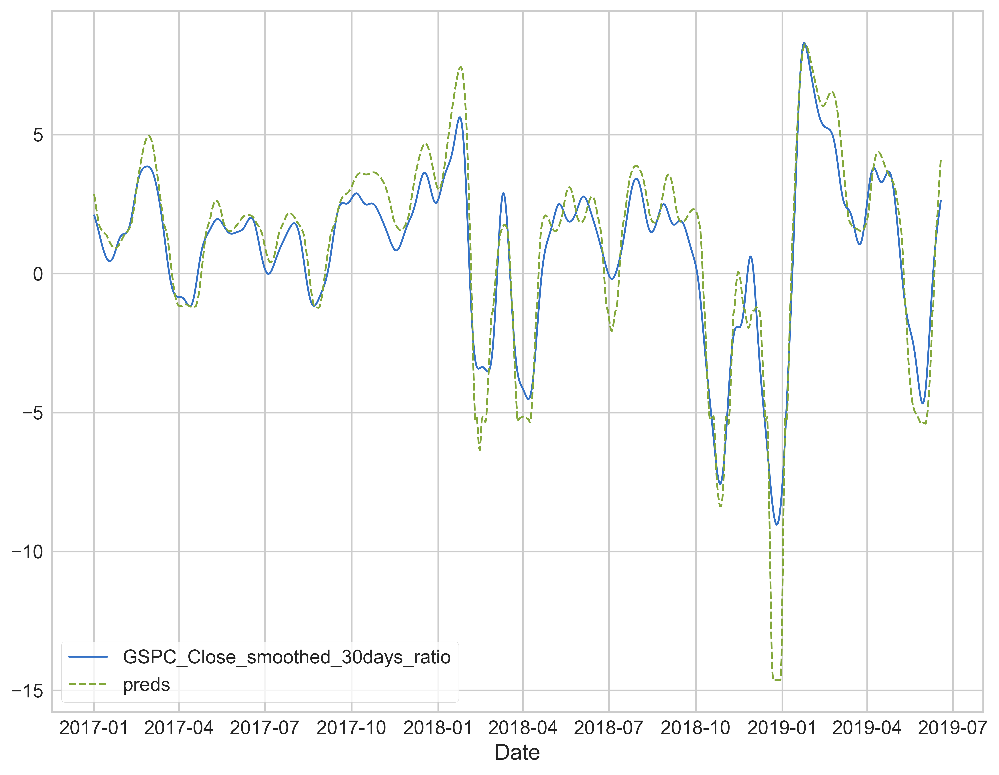

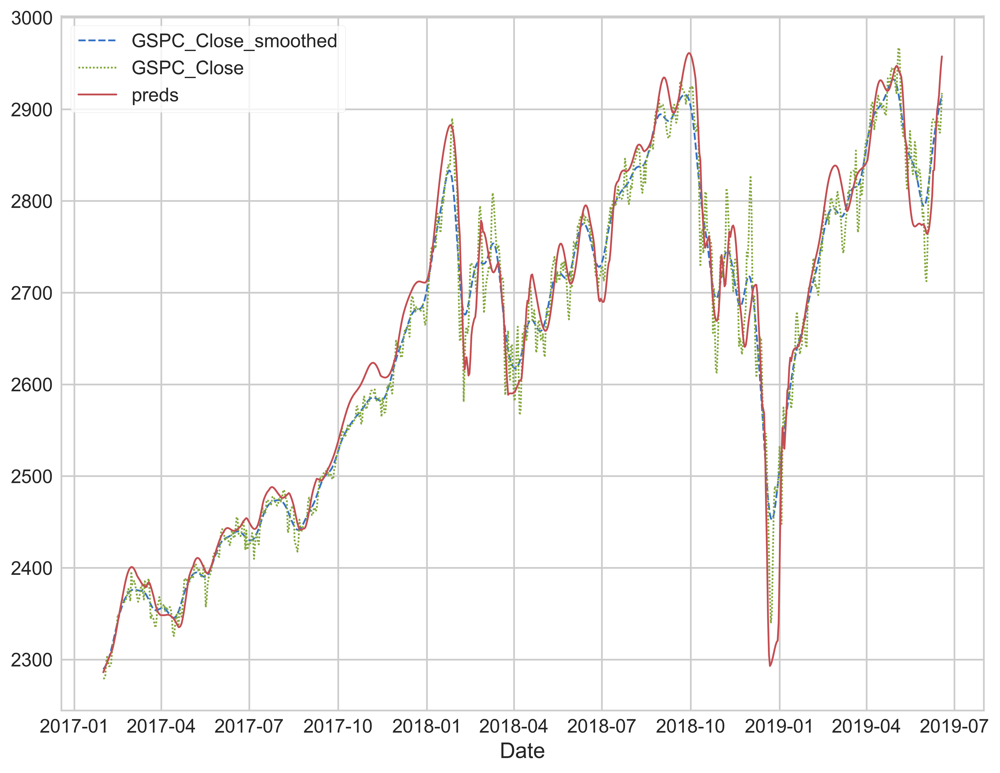

Prediction is -1.001152073732726 days behind reference


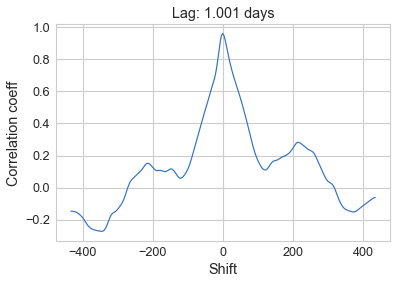


For major peaks in the index:

The average delay around the peaks are 3.0 days
The median delay around the peaks are 3.0 days


,Days Delayed
2017-02-28,0.0
2017-05-05,3.0
2017-06-06,1.0
2017-07-23,0.0
2017-11-04,1.0
2017-12-19,3.0
2018-01-24,1.0
2018-02-23,3.0
2018-03-10,6.0
2018-04-18,2.0


In [16]:
plot_results(mlp_sklearn_model,X_valid, y_valid, start_time='2017-01-01', end_time='2020-01-03')

Epoch 1/500
3/3 [==============================] - 0s 87ms/step - loss: 3.0024 - mae: 3.0024 - val_loss: 2.7362 - val_mae: 2.7362
Epoch 2/500
3/3 [==============================] - 0s 16ms/step - loss: 2.6297 - mae: 2.6297 - val_loss: 4.2975 - val_mae: 4.2975
Epoch 3/500
3/3 [==============================] - 0s 15ms/step - loss: 2.4482 - mae: 2.4482 - val_loss: 4.6281 - val_mae: 4.6281
Epoch 4/500
3/3 [==============================] - 0s 15ms/step - loss: 2.3081 - mae: 2.3081 - val_loss: 3.7263 - val_mae: 3.7263
Epoch 5/500
3/3 [==============================] - 0s 15ms/step - loss: 2.1961 - mae: 2.1961 - val_loss: 3.8408 - val_mae: 3.8408
Epoch 6/500
3/3 [==============================] - 0s 15ms/step - loss: 2.1294 - mae: 2.1294 - val_loss: 3.4964 - val_mae: 3.4964
Epoch 7/500
3/3 [==============================] - 0s 15ms/step - loss: 2.0403 - mae: 2.0403 - val_loss: 3.5359 - val_mae: 3.5359
Epoch 8/500
3/3 [==============================] - 0s 15ms/step - loss: 1.9682 - mae: 1.96

3/3 [==============================] - 0s 15ms/step - loss: 1.1636 - mae: 1.1636 - val_loss: 1.7565 - val_mae: 1.7565
Epoch 64/500
3/3 [==============================] - 0s 14ms/step - loss: 1.1572 - mae: 1.1572 - val_loss: 1.7072 - val_mae: 1.7072
Epoch 65/500
3/3 [==============================] - 0s 16ms/step - loss: 1.1253 - mae: 1.1253 - val_loss: 1.3570 - val_mae: 1.3570
Epoch 66/500
3/3 [==============================] - 0s 14ms/step - loss: 1.1252 - mae: 1.1252 - val_loss: 1.6338 - val_mae: 1.6338
Epoch 67/500
3/3 [==============================] - 0s 14ms/step - loss: 1.1351 - mae: 1.1351 - val_loss: 1.4624 - val_mae: 1.4624
Epoch 68/500
3/3 [==============================] - 0s 15ms/step - loss: 1.1252 - mae: 1.1252 - val_loss: 1.7976 - val_mae: 1.7976
Epoch 69/500
3/3 [==============================] - 0s 14ms/step - loss: 1.1254 - mae: 1.1254 - val_loss: 1.4050 - val_mae: 1.4050
Epoch 70/500
3/3 [==============================] - 0s 13ms/step - loss: 1.1228 - mae: 1.1228 - 

Epoch 125/500
3/3 [==============================] - 0s 14ms/step - loss: 0.9906 - mae: 0.9906 - val_loss: 1.0437 - val_mae: 1.0437
Epoch 126/500
3/3 [==============================] - 0s 15ms/step - loss: 0.9770 - mae: 0.9770 - val_loss: 0.9634 - val_mae: 0.9634
Epoch 127/500
3/3 [==============================] - 0s 14ms/step - loss: 0.9939 - mae: 0.9939 - val_loss: 0.9727 - val_mae: 0.9727
Epoch 128/500
3/3 [==============================] - 0s 14ms/step - loss: 0.9898 - mae: 0.9898 - val_loss: 0.9406 - val_mae: 0.9406
Epoch 129/500
3/3 [==============================] - 0s 14ms/step - loss: 0.9845 - mae: 0.9845 - val_loss: 0.9056 - val_mae: 0.9056
Epoch 130/500
3/3 [==============================] - 0s 14ms/step - loss: 0.9903 - mae: 0.9903 - val_loss: 0.9236 - val_mae: 0.9236
Epoch 131/500
3/3 [==============================] - 0s 14ms/step - loss: 0.9869 - mae: 0.9869 - val_loss: 0.9807 - val_mae: 0.9807
Epoch 132/500
3/3 [==============================] - 0s 14ms/step - loss: 0.

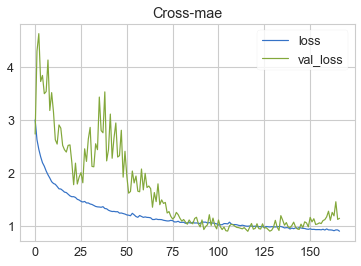

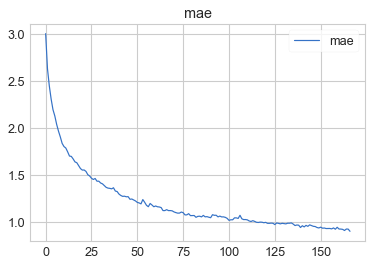

In [17]:
mlp_tf_model = keras.Sequential([
    layers.Dense(256, activation='relu',input_shape=[X_train.shape[1]]),   
    layers.BatchNormalization(),
    layers.Dropout(0.3),
    layers.Dense(256),   
    layers.BatchNormalization(),
    layers.LeakyReLU(),
    layers.Dropout(0.3),
    layers.Dense(256),   
    layers.BatchNormalization(),
    layers.LeakyReLU(),
    layers.Dropout(0.3),
    layers.Dense(256),   
    layers.BatchNormalization(),
    layers.LeakyReLU(),
    layers.Dropout(0.3),
    layers.Dense(256),     
    layers.BatchNormalization(),
    layers.LeakyReLU(),
    layers.Dense(1),
    layers.LeakyReLU(),
])


# mlp_tf_model = keras.Sequential([
#     layers.Dense(28, activation='relu',input_shape=[X_train.shape[1]]),
#     layers.BatchNormalization(),
#     layers.Dense(64, activation='relu',input_shape=[X_train.shape[1]]),   
#     layers.BatchNormalization(),
#     layers.Dense(128, activation='relu'), 
#     layers.BatchNormalization(),
#     layers.Dense(256), 
#     layers.LeakyReLU(),
#     layers.BatchNormalization(),
#     layers.Dense(256), 
#     layers.LeakyReLU(),
#     layers.BatchNormalization(),
#     layers.Dense(256), 
#     layers.LeakyReLU(),
#     layers.BatchNormalization(),
#     layers.Dense(256), 
#     layers.LeakyReLU(),
#     layers.BatchNormalization(),
#     layers.Dense(256), 
#     layers.LeakyReLU(),
#     layers.BatchNormalization(),
#     layers.Dense(256), 
#     layers.LeakyReLU(),
#     layers.BatchNormalization(),
#     layers.Dense(1, activation='relu'),
# ])

# mlp_tf_model = keras.Sequential([
#     layers.Dense(28, activation='relu',input_shape=[X_train.shape[1]]),   
#     layers.Dense(14, activation='relu'), 
#     layers.Dense(14, activation='relu'), 
#     layers.Dense(7, activation='relu'), 
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(7, activation='relu'),
#     layers.Dense(3, activation='relu'),
#     layers.Dense(3, activation='relu'),
#     layers.Dense(1, activation='relu'),
# ])

mlp_tf_model.compile(
    optimizer='adam',
    loss='mae',
     metrics=['mae'],
)

early_stopping = keras.callbacks.EarlyStopping(
    patience=50,
    min_delta=0.0001,
    restore_best_weights=True,
)

history = mlp_tf_model.fit(
    X_train, y_train,
    validation_data=(X_valid, y_valid),
    batch_size=365*10,
    epochs=500,
    callbacks=[early_stopping]
)

history_df = pd.DataFrame(history.history)
history_df.loc[:, ['loss', 'val_loss']].plot(title="Cross-mae")
history_df.loc[:, ['mae']].plot(title="mae")
print(("Minimum Validation Loss: {:0.4f}").format(history_df['val_loss'].min()))
print(f'Model test accuracy: {history_df["mae"].max():.3f}')

The absolut error is 0.993%
26.31023365052592


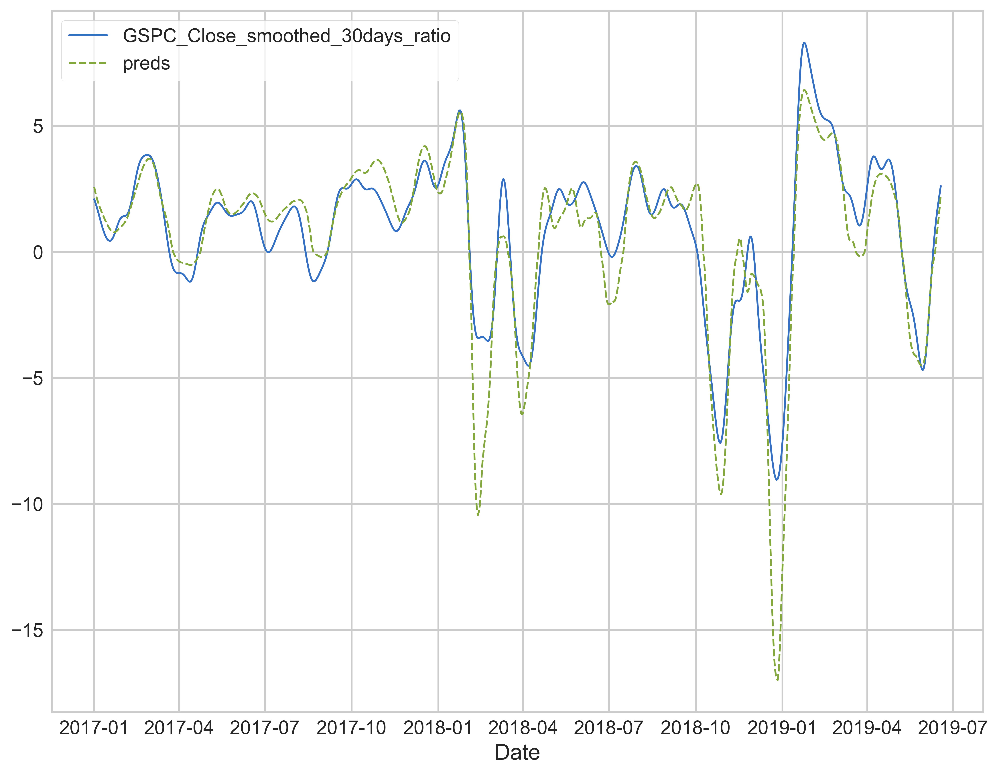

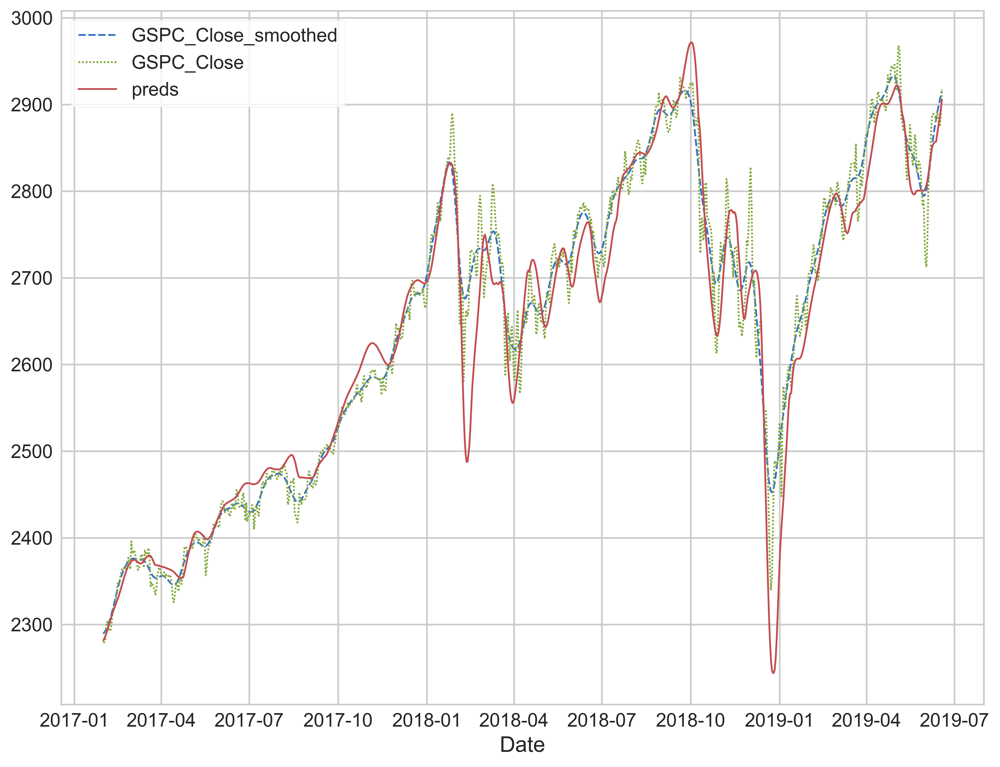

Prediction is -2.002304147465452 days behind reference


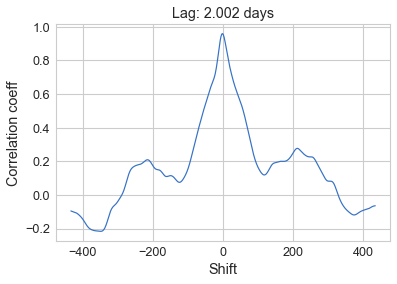


For major peaks in the index:

The average delay around the peaks are 3.15 days
The median delay around the peaks are 2.5 days


,Days Delayed
2017-02-28,2.0
2017-05-05,2.0
2017-06-06,2.0
2017-07-23,-3.0
2017-11-04,0.0
2017-12-19,1.0
2018-01-24,1.0
2018-02-23,7.0
2018-03-10,7.0
2018-04-18,2.0


In [18]:
plot_results(mlp_tf_model,X_valid, y_valid, start_time='2017-01-01', end_time='2020-01-03')

In [19]:
def dnn_prepare(df, length):
    output=[]
    df_vals=df.values
    for i in range(length, df_vals.shape[0]):
        output.append(df_vals[i-length:i])
    output = np.array(output)

    return output

train_X_dnn = dnn_prepare(X_train,prediction_distance*2)
y_train_dnn = y_train[prediction_distance*2:]

valid_X_dnn = dnn_prepare(X_valid,prediction_distance*2)
y_valid_dnn = y_valid[prediction_distance*2:]

val_X_dnn = dnn_prepare(X_val,prediction_distance*2)
y_val_dnn = y_val[prediction_distance*2:]

test_X_dnn = dnn_prepare(X_test,prediction_distance*2)
y_test_dnn = y_test[prediction_distance*2:]

In [20]:
# lstm_prepare(X_train,60).shape

Epoch 1/2000
6/6 [==============================] - 1s 90ms/step - loss: 3.2218 - mae: 3.2218 - val_loss: 2.2785 - val_mae: 2.2785
Epoch 2/2000
6/6 [==============================] - 0s 15ms/step - loss: 3.1862 - mae: 3.1862 - val_loss: 2.2544 - val_mae: 2.2544
Epoch 3/2000
6/6 [==============================] - 0s 15ms/step - loss: 3.1282 - mae: 3.1282 - val_loss: 2.2358 - val_mae: 2.2358
Epoch 4/2000
6/6 [==============================] - 0s 15ms/step - loss: 3.1002 - mae: 3.1002 - val_loss: 2.2167 - val_mae: 2.2167
Epoch 5/2000
6/6 [==============================] - 0s 15ms/step - loss: 3.0643 - mae: 3.0643 - val_loss: 2.2160 - val_mae: 2.2160
Epoch 6/2000
6/6 [==============================] - 0s 16ms/step - loss: 3.0473 - mae: 3.0473 - val_loss: 2.1908 - val_mae: 2.1908
Epoch 7/2000
6/6 [==============================] - 0s 15ms/step - loss: 3.0062 - mae: 3.0062 - val_loss: 2.1524 - val_mae: 2.1524
Epoch 8/2000
6/6 [==============================] - 0s 16ms/step - loss: 2.9835 - m

6/6 [==============================] - 0s 15ms/step - loss: 2.7936 - mae: 2.7936 - val_loss: 1.6426 - val_mae: 1.6426
Epoch 64/2000
6/6 [==============================] - 0s 14ms/step - loss: 2.7944 - mae: 2.7944 - val_loss: 1.6678 - val_mae: 1.6678
Epoch 65/2000
6/6 [==============================] - 0s 14ms/step - loss: 2.7825 - mae: 2.7825 - val_loss: 1.6676 - val_mae: 1.6676
Epoch 66/2000
6/6 [==============================] - 0s 14ms/step - loss: 2.7864 - mae: 2.7864 - val_loss: 1.7101 - val_mae: 1.7101
Epoch 67/2000
6/6 [==============================] - 0s 14ms/step - loss: 2.7598 - mae: 2.7598 - val_loss: 1.6941 - val_mae: 1.6941
Epoch 68/2000
6/6 [==============================] - 0s 14ms/step - loss: 2.7794 - mae: 2.7794 - val_loss: 1.7241 - val_mae: 1.7241
Epoch 69/2000
6/6 [==============================] - 0s 14ms/step - loss: 2.7564 - mae: 2.7564 - val_loss: 1.7363 - val_mae: 1.7363
Epoch 70/2000
6/6 [==============================] - 0s 14ms/step - loss: 2.7771 - mae: 2.

Epoch 125/2000
6/6 [==============================] - 0s 15ms/step - loss: 2.7294 - mae: 2.7294 - val_loss: 1.7325 - val_mae: 1.7325
Epoch 126/2000
6/6 [==============================] - 0s 15ms/step - loss: 2.7200 - mae: 2.7200 - val_loss: 1.6405 - val_mae: 1.6405
Epoch 127/2000
6/6 [==============================] - 0s 14ms/step - loss: 2.7295 - mae: 2.7295 - val_loss: 1.6056 - val_mae: 1.6056
Epoch 128/2000
6/6 [==============================] - 0s 14ms/step - loss: 2.7525 - mae: 2.7525 - val_loss: 1.6444 - val_mae: 1.6444
Epoch 129/2000
6/6 [==============================] - 0s 14ms/step - loss: 2.7274 - mae: 2.7274 - val_loss: 1.6406 - val_mae: 1.6406
Epoch 130/2000
6/6 [==============================] - 0s 14ms/step - loss: 2.7200 - mae: 2.7200 - val_loss: 1.6289 - val_mae: 1.6289
Epoch 131/2000
6/6 [==============================] - 0s 14ms/step - loss: 2.7404 - mae: 2.7404 - val_loss: 1.6859 - val_mae: 1.6859
Epoch 132/2000
6/6 [==============================] - 0s 14ms/step - 

6/6 [==============================] - 0s 14ms/step - loss: 2.7173 - mae: 2.7173 - val_loss: 1.8472 - val_mae: 1.8472
Epoch 187/2000
6/6 [==============================] - 0s 15ms/step - loss: 2.6876 - mae: 2.6876 - val_loss: 1.9815 - val_mae: 1.9815
Epoch 188/2000
6/6 [==============================] - 0s 14ms/step - loss: 2.7082 - mae: 2.7082 - val_loss: 1.9698 - val_mae: 1.9698
Epoch 189/2000
6/6 [==============================] - 0s 14ms/step - loss: 2.7236 - mae: 2.7236 - val_loss: 2.0075 - val_mae: 2.0075
Epoch 190/2000
6/6 [==============================] - 0s 14ms/step - loss: 2.7116 - mae: 2.7116 - val_loss: 1.9205 - val_mae: 1.9205
Epoch 191/2000
6/6 [==============================] - 0s 15ms/step - loss: 2.7597 - mae: 2.7597 - val_loss: 1.8547 - val_mae: 1.8547
Epoch 192/2000
6/6 [==============================] - 0s 16ms/step - loss: 2.7282 - mae: 2.7282 - val_loss: 1.8391 - val_mae: 1.8391
Epoch 193/2000
6/6 [==============================] - 0s 15ms/step - loss: 2.7458 - 

Epoch 248/2000
6/6 [==============================] - 0s 15ms/step - loss: 2.6795 - mae: 2.6795 - val_loss: 1.6132 - val_mae: 1.6132
Epoch 249/2000
6/6 [==============================] - 0s 15ms/step - loss: 2.6830 - mae: 2.6830 - val_loss: 1.5912 - val_mae: 1.5912
Epoch 250/2000
6/6 [==============================] - 0s 16ms/step - loss: 2.6694 - mae: 2.6694 - val_loss: 1.5935 - val_mae: 1.5935
Epoch 251/2000
6/6 [==============================] - 0s 17ms/step - loss: 2.6850 - mae: 2.6850 - val_loss: 1.7239 - val_mae: 1.7239
Epoch 252/2000
6/6 [==============================] - 0s 14ms/step - loss: 2.7293 - mae: 2.7293 - val_loss: 1.7060 - val_mae: 1.7060
Epoch 253/2000
6/6 [==============================] - 0s 14ms/step - loss: 2.7228 - mae: 2.7228 - val_loss: 1.6873 - val_mae: 1.6873
Epoch 254/2000
6/6 [==============================] - 0s 15ms/step - loss: 2.7351 - mae: 2.7351 - val_loss: 1.7830 - val_mae: 1.7830
Epoch 255/2000
6/6 [==============================] - 0s 15ms/step - 

6/6 [==============================] - 0s 15ms/step - loss: 2.7114 - mae: 2.7114 - val_loss: 1.7437 - val_mae: 1.7437
Epoch 310/2000
6/6 [==============================] - 0s 14ms/step - loss: 2.7671 - mae: 2.7671 - val_loss: 1.8539 - val_mae: 1.8539
Epoch 311/2000
6/6 [==============================] - 0s 14ms/step - loss: 2.7841 - mae: 2.7841 - val_loss: 1.8034 - val_mae: 1.8034
Epoch 312/2000
6/6 [==============================] - 0s 15ms/step - loss: 2.7890 - mae: 2.7890 - val_loss: 1.7130 - val_mae: 1.7130
Epoch 313/2000
6/6 [==============================] - 0s 15ms/step - loss: 2.7533 - mae: 2.7533 - val_loss: 1.7006 - val_mae: 1.7006
Epoch 314/2000
6/6 [==============================] - 0s 16ms/step - loss: 2.7352 - mae: 2.7352 - val_loss: 1.7033 - val_mae: 1.7033
Epoch 315/2000
6/6 [==============================] - 0s 16ms/step - loss: 2.7110 - mae: 2.7110 - val_loss: 1.6696 - val_mae: 1.6696
Epoch 316/2000
6/6 [==============================] - 0s 15ms/step - loss: 2.7017 - 

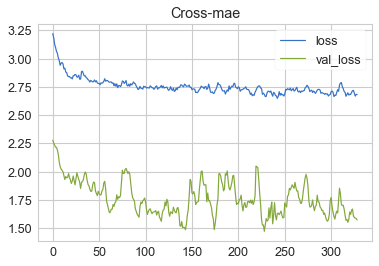

In [21]:


# design network
LSTM_model = keras.Sequential([
    layers.LSTM(16, input_shape=(train_X_dnn.shape[1], train_X_dnn.shape[2]), return_sequences=False),  
    layers.BatchNormalization(),
    layers.Dropout(0.3),
    layers.Dense(16),   
    layers.BatchNormalization(),
    layers.LeakyReLU(),
    layers.Dropout(0.3),
    layers.Dense(16),   
    layers.BatchNormalization(),
    layers.LeakyReLU(),
    layers.Dropout(0.3),
#     layers.Dense(256),   
#     layers.BatchNormalization(),
#     layers.LeakyReLU(),
#     layers.Dropout(0.3),
#     layers.Dense(256),     
#     layers.BatchNormalization(),
#     layers.LeakyReLU(),
    layers.Dense(1),
#     layers.LeakyReLU(),
])

# LSTM_model = keras.Sequential([
#     layers.LSTM(32, input_shape=(train_X_dnn.shape[1], train_X_dnn.shape[2]), return_sequences=False),  
#     layers.BatchNormalization(),
#     layers.Dropout(0.3),
#     layers.Dense(32),   
#     layers.BatchNormalization(),
#     layers.LeakyReLU(),
#     layers.Dropout(0.3),
#     layers.Dense(16),   
#     layers.BatchNormalization(),
#     layers.LeakyReLU(),
#     layers.Dropout(0.3),
#     layers.Dense(16),   
#     layers.BatchNormalization(),
#     layers.LeakyReLU(),
#     layers.Dropout(0.3),
# #     layers.Dense(256),     
# #     layers.BatchNormalization(),
# #     layers.LeakyReLU(),
#     layers.Dense(1),
#     layers.LeakyReLU(),
# ])

LSTM_model.compile(
    optimizer='adam',
    loss='mae',
     metrics=['mae'],
)

# fit network
# history = LSTM_model.fit(train_X, y_train, epochs=50, batch_size=72, validation_data=(test_X, y_test), verbose=2, shuffle=False)
early_stopping = keras.callbacks.EarlyStopping(
    patience=100,
    min_delta=0.0001,
    restore_best_weights=True,
)

history = LSTM_model.fit(
    train_X_dnn, y_train_dnn,
    validation_data=(val_X_dnn, y_val_dnn),
    batch_size=365*5,
    epochs=2000,
    callbacks=[early_stopping]
)

# plot history
history_df = pd.DataFrame(history.history)
history_df.loc[:, ['loss', 'val_loss']].plot(title="Cross-mae")
print(("Minimum Validation Loss: {:0.4f}").format(history_df['val_loss'].min()))




In [22]:
lstm_preds=LSTM_model.predict(test_X_dnn)
lstm_score = mean_absolute_error(y_test_dnn, lstm_preds)
print(f"Test mae = {round(lstm_score,4)}")

Test mae = 1.5179


The absolut error is 1.586%
42.146837469865396


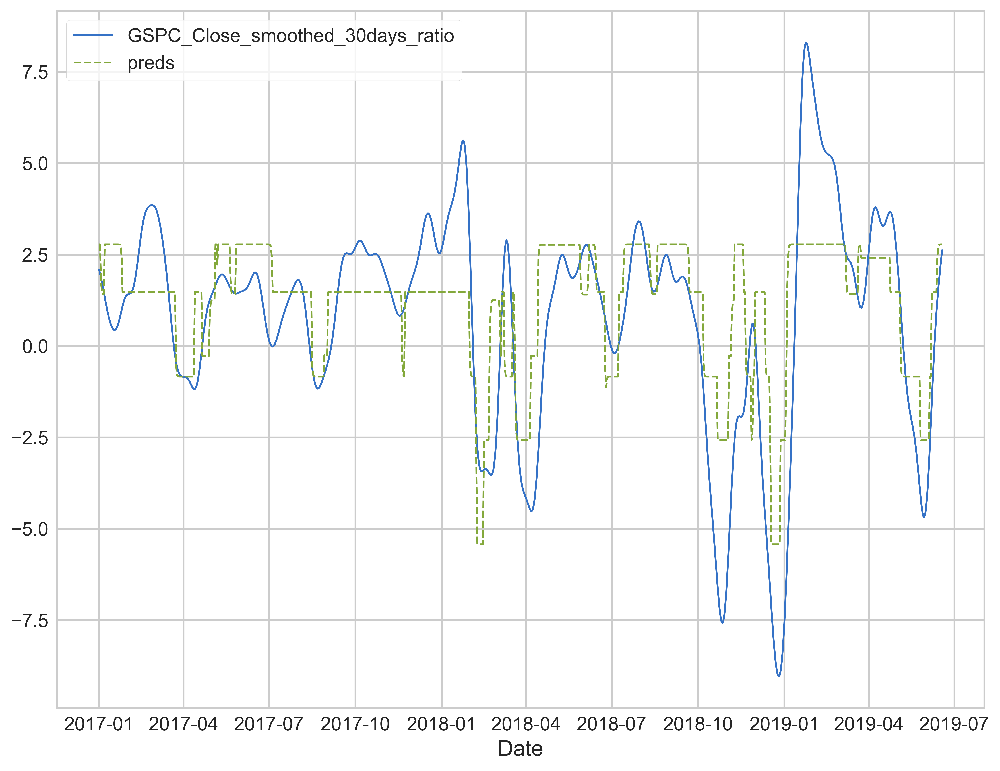

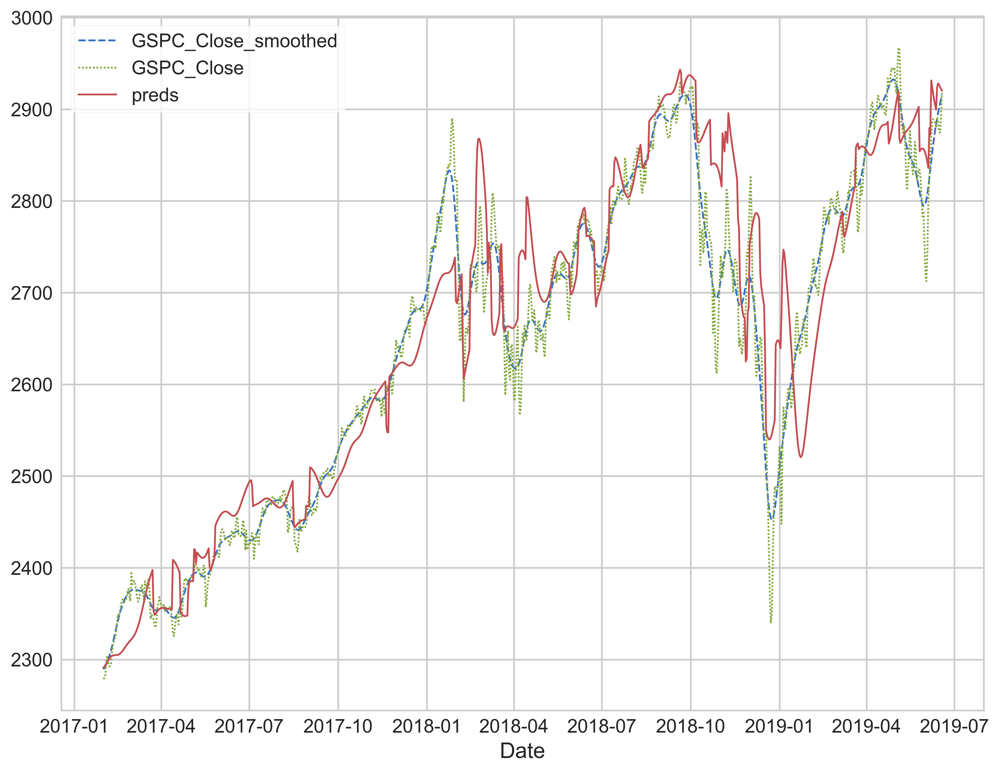

Prediction is -31.035714285714278 days behind reference


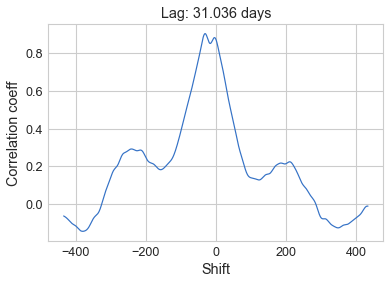


For major peaks in the index:

The average delay around the peaks are 0.55 days
The median delay around the peaks are 2.0 days


,Days Delayed
2017-02-28,-19.0
2017-05-05,0.0
2017-06-06,-2.0
2017-07-23,-21.0
2017-11-04,15.0
2017-12-19,-15.0
2018-01-24,6.0
2018-02-23,0.0
2018-03-10,9.0
2018-04-18,-4.0


In [23]:
plot_results(LSTM_model,test_X_dnn, y_test_dnn, start_time='2017-01-01', end_time='2020-01-03')

Epoch 1/500
6/6 [==============================] - 0s 65ms/step - loss: 3.0530 - mae: 3.0530 - val_loss: 14.3468 - val_mae: 14.3468
Epoch 2/500
6/6 [==============================] - 0s 22ms/step - loss: 2.7712 - mae: 2.7712 - val_loss: 6.2079 - val_mae: 6.2079
Epoch 3/500
6/6 [==============================] - 0s 20ms/step - loss: 2.5048 - mae: 2.5048 - val_loss: 9.3334 - val_mae: 9.3334
Epoch 4/500
6/6 [==============================] - 0s 20ms/step - loss: 2.2640 - mae: 2.2640 - val_loss: 11.5536 - val_mae: 11.5536
Epoch 5/500
6/6 [==============================] - 0s 21ms/step - loss: 2.1090 - mae: 2.1090 - val_loss: 12.0732 - val_mae: 12.0732
Epoch 6/500
6/6 [==============================] - 0s 21ms/step - loss: 2.0367 - mae: 2.0367 - val_loss: 15.3670 - val_mae: 15.3670
Epoch 7/500
6/6 [==============================] - 0s 22ms/step - loss: 1.9203 - mae: 1.9203 - val_loss: 14.3743 - val_mae: 14.3743
Epoch 8/500
6/6 [==============================] - 0s 31ms/step - loss: 1.8406 -

6/6 [==============================] - 0s 21ms/step - loss: 0.9798 - mae: 0.9798 - val_loss: 0.8777 - val_mae: 0.8777
Epoch 64/500
6/6 [==============================] - 0s 20ms/step - loss: 0.9679 - mae: 0.9679 - val_loss: 1.2583 - val_mae: 1.2583
Epoch 65/500
6/6 [==============================] - 0s 20ms/step - loss: 0.9843 - mae: 0.9843 - val_loss: 1.0649 - val_mae: 1.0649
Epoch 66/500
6/6 [==============================] - 0s 20ms/step - loss: 0.9629 - mae: 0.9629 - val_loss: 0.7660 - val_mae: 0.7660
Epoch 67/500
6/6 [==============================] - 0s 20ms/step - loss: 1.0045 - mae: 1.0045 - val_loss: 1.0642 - val_mae: 1.0642
Epoch 68/500
6/6 [==============================] - 0s 23ms/step - loss: 0.9940 - mae: 0.9940 - val_loss: 0.7152 - val_mae: 0.7152
Epoch 69/500
6/6 [==============================] - 0s 23ms/step - loss: 0.9468 - mae: 0.9468 - val_loss: 0.7059 - val_mae: 0.7059
Epoch 70/500
6/6 [==============================] - 0s 21ms/step - loss: 0.9319 - mae: 0.9319 - 

6/6 [==============================] - 0s 20ms/step - loss: 0.8217 - mae: 0.8217 - val_loss: 1.1205 - val_mae: 1.1205
Epoch 126/500
6/6 [==============================] - 0s 21ms/step - loss: 0.8347 - mae: 0.8347 - val_loss: 0.8092 - val_mae: 0.8092
Epoch 127/500
6/6 [==============================] - 0s 20ms/step - loss: 0.8281 - mae: 0.8281 - val_loss: 0.5441 - val_mae: 0.5441
Epoch 128/500
6/6 [==============================] - 0s 21ms/step - loss: 0.8003 - mae: 0.8003 - val_loss: 0.5393 - val_mae: 0.5393
Epoch 129/500
6/6 [==============================] - 0s 20ms/step - loss: 0.8082 - mae: 0.8082 - val_loss: 0.5224 - val_mae: 0.5224
Epoch 130/500
6/6 [==============================] - 0s 21ms/step - loss: 0.8023 - mae: 0.8023 - val_loss: 0.4646 - val_mae: 0.4646
Epoch 131/500
6/6 [==============================] - 0s 21ms/step - loss: 0.8843 - mae: 0.8843 - val_loss: 0.5997 - val_mae: 0.5997
Epoch 132/500
6/6 [==============================] - 0s 20ms/step - loss: 0.8484 - mae: 0.

6/6 [==============================] - 0s 20ms/step - loss: 0.7993 - mae: 0.7993 - val_loss: 0.3994 - val_mae: 0.3994
Epoch 188/500
6/6 [==============================] - 0s 20ms/step - loss: 0.7558 - mae: 0.7558 - val_loss: 0.7010 - val_mae: 0.7010
Epoch 189/500
6/6 [==============================] - 0s 20ms/step - loss: 0.7249 - mae: 0.7249 - val_loss: 0.4453 - val_mae: 0.4453
Epoch 190/500
6/6 [==============================] - 0s 20ms/step - loss: 0.7315 - mae: 0.7315 - val_loss: 0.5485 - val_mae: 0.5485
Epoch 191/500
6/6 [==============================] - 0s 20ms/step - loss: 0.8756 - mae: 0.8756 - val_loss: 0.4260 - val_mae: 0.4260
Epoch 192/500
6/6 [==============================] - 0s 20ms/step - loss: 0.8458 - mae: 0.8458 - val_loss: 0.7084 - val_mae: 0.7084
Epoch 193/500
6/6 [==============================] - 0s 20ms/step - loss: 0.7830 - mae: 0.7830 - val_loss: 0.4426 - val_mae: 0.4426
Epoch 194/500
6/6 [==============================] - 0s 20ms/step - loss: 0.7813 - mae: 0.

6/6 [==============================] - 0s 20ms/step - loss: 0.6889 - mae: 0.6889 - val_loss: 0.3568 - val_mae: 0.3568
Epoch 250/500
6/6 [==============================] - 0s 21ms/step - loss: 0.6781 - mae: 0.6781 - val_loss: 0.3994 - val_mae: 0.3994
Epoch 251/500
6/6 [==============================] - 0s 20ms/step - loss: 0.6974 - mae: 0.6974 - val_loss: 0.5690 - val_mae: 0.5690
Epoch 252/500
6/6 [==============================] - 0s 20ms/step - loss: 0.6698 - mae: 0.6698 - val_loss: 0.3594 - val_mae: 0.3594
Epoch 253/500
6/6 [==============================] - 0s 20ms/step - loss: 0.6965 - mae: 0.6965 - val_loss: 0.5863 - val_mae: 0.5863
Epoch 254/500
6/6 [==============================] - 0s 20ms/step - loss: 0.6914 - mae: 0.6914 - val_loss: 0.3654 - val_mae: 0.3654
Epoch 255/500
6/6 [==============================] - 0s 20ms/step - loss: 0.7070 - mae: 0.7070 - val_loss: 0.6551 - val_mae: 0.6551
Epoch 256/500
6/6 [==============================] - 0s 20ms/step - loss: 0.7273 - mae: 0.

6/6 [==============================] - 0s 20ms/step - loss: 0.7109 - mae: 0.7109 - val_loss: 0.3698 - val_mae: 0.3698
Epoch 312/500
6/6 [==============================] - 0s 20ms/step - loss: 0.7366 - mae: 0.7366 - val_loss: 0.7439 - val_mae: 0.7439
Epoch 313/500
6/6 [==============================] - 0s 20ms/step - loss: 0.7056 - mae: 0.7056 - val_loss: 0.3938 - val_mae: 0.3938
Epoch 314/500
6/6 [==============================] - 0s 20ms/step - loss: 0.6732 - mae: 0.6732 - val_loss: 0.5022 - val_mae: 0.5022
Epoch 315/500
6/6 [==============================] - 0s 20ms/step - loss: 0.6644 - mae: 0.6644 - val_loss: 0.3681 - val_mae: 0.3681
Epoch 316/500
6/6 [==============================] - 0s 20ms/step - loss: 0.6541 - mae: 0.6541 - val_loss: 0.4367 - val_mae: 0.4367
Epoch 317/500
6/6 [==============================] - 0s 20ms/step - loss: 0.6626 - mae: 0.6626 - val_loss: 0.5740 - val_mae: 0.5740
Epoch 318/500
6/6 [==============================] - 0s 26ms/step - loss: 0.6461 - mae: 0.

6/6 [==============================] - 0s 20ms/step - loss: 0.6961 - mae: 0.6961 - val_loss: 0.4023 - val_mae: 0.4023
Epoch 374/500
6/6 [==============================] - 0s 20ms/step - loss: 0.6673 - mae: 0.6673 - val_loss: 0.3889 - val_mae: 0.3889
Epoch 375/500
6/6 [==============================] - 0s 20ms/step - loss: 0.6393 - mae: 0.6393 - val_loss: 0.4438 - val_mae: 0.4438
Epoch 376/500
6/6 [==============================] - 0s 21ms/step - loss: 0.6571 - mae: 0.6571 - val_loss: 0.3094 - val_mae: 0.3094
Epoch 377/500
6/6 [==============================] - 0s 20ms/step - loss: 0.6120 - mae: 0.6120 - val_loss: 0.7316 - val_mae: 0.7316
Epoch 378/500
6/6 [==============================] - 0s 20ms/step - loss: 0.6314 - mae: 0.6314 - val_loss: 0.4198 - val_mae: 0.4198
Epoch 379/500
6/6 [==============================] - 0s 20ms/step - loss: 0.6129 - mae: 0.6129 - val_loss: 0.3575 - val_mae: 0.3575
Epoch 380/500
6/6 [==============================] - 0s 20ms/step - loss: 0.6446 - mae: 0.

6/6 [==============================] - 0s 20ms/step - loss: 0.6087 - mae: 0.6087 - val_loss: 0.3284 - val_mae: 0.3284
Epoch 436/500
6/6 [==============================] - 0s 21ms/step - loss: 0.6577 - mae: 0.6577 - val_loss: 0.5226 - val_mae: 0.5226
Epoch 437/500
6/6 [==============================] - 0s 20ms/step - loss: 0.6267 - mae: 0.6267 - val_loss: 0.5305 - val_mae: 0.5305
Epoch 438/500
6/6 [==============================] - 0s 21ms/step - loss: 0.6273 - mae: 0.6273 - val_loss: 0.5094 - val_mae: 0.5094
Epoch 439/500
6/6 [==============================] - 0s 21ms/step - loss: 0.6023 - mae: 0.6023 - val_loss: 0.8562 - val_mae: 0.8562
Epoch 440/500
6/6 [==============================] - 0s 20ms/step - loss: 0.6205 - mae: 0.6205 - val_loss: 0.3421 - val_mae: 0.3421
Epoch 441/500
6/6 [==============================] - 0s 21ms/step - loss: 0.5943 - mae: 0.5943 - val_loss: 0.3345 - val_mae: 0.3345
Epoch 442/500
6/6 [==============================] - 0s 22ms/step - loss: 0.6104 - mae: 0.

6/6 [==============================] - 0s 21ms/step - loss: 0.6696 - mae: 0.6696 - val_loss: 0.6847 - val_mae: 0.6847
Epoch 498/500
6/6 [==============================] - 0s 20ms/step - loss: 0.6193 - mae: 0.6193 - val_loss: 0.5036 - val_mae: 0.5036
Epoch 499/500
6/6 [==============================] - 0s 21ms/step - loss: 0.7055 - mae: 0.7055 - val_loss: 0.4298 - val_mae: 0.4298
Epoch 500/500
6/6 [==============================] - 0s 19ms/step - loss: 0.6647 - mae: 0.6647 - val_loss: 0.3337 - val_mae: 0.3337
Minimum Validation Loss: 0.2722


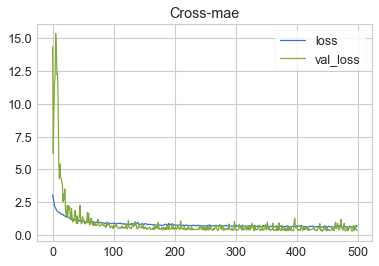

In [27]:
# design network

cnn_model = keras.Sequential([
    layers.Conv1D(filters=64, kernel_size=int(prediction_distance/2), activation='relu', input_shape=(train_X_dnn.shape[1],train_X_dnn.shape[2])), 
    layers.MaxPooling1D(pool_size=2),
    layers.Flatten(),
    layers.BatchNormalization(),
    layers.Dropout(0.3),
    layers.Dense(64),   
    layers.BatchNormalization(),
    layers.LeakyReLU(),
    layers.Dropout(0.3),
    layers.Dense(64),   
    layers.BatchNormalization(),
    layers.LeakyReLU(),
    layers.Dropout(0.3),
#     layers.Dense(32),   
#     layers.BatchNormalization(),
#     layers.LeakyReLU(),
#     layers.Dropout(0.3),
    layers.Dense(32),     
    layers.BatchNormalization(),
    layers.LeakyReLU(),
    layers.Dense(1),
    layers.LeakyReLU(),
]) #0.6251


cnn_model.compile(
    optimizer='adam',
    loss='mae',
     metrics=['mae'],
)

# fit network
# history = LSTM_model.fit(train_X, y_train, epochs=50, batch_size=72, validation_data=(test_X, y_test), verbose=2, shuffle=False)

early_stopping = keras.callbacks.EarlyStopping(
    patience=100,
    min_delta=0.00005,
    restore_best_weights=True,
)

cnn_history = cnn_model.fit(
    train_X_dnn, y_train_dnn,
    validation_data=(val_X_dnn, y_val_dnn),
    batch_size=365*5,
    epochs=500,
    callbacks=[early_stopping]
)

# plot history
cnn_history_df = pd.DataFrame(cnn_history.history)
cnn_history_df.loc[:, ['loss', 'val_loss']].plot(title="Cross-mae")

print(("Minimum Validation Loss: {:0.4f}").format(cnn_history_df['val_loss'].min()))


In [28]:
cnn_preds=cnn_model.predict(test_X_dnn)
cnn_score = mean_absolute_error(y_test_dnn, cnn_preds)
print(f"Test mae = {round(cnn_score,4)}")

Test mae = 0.4513


The absolut error is 0.526%
14.006346827265839


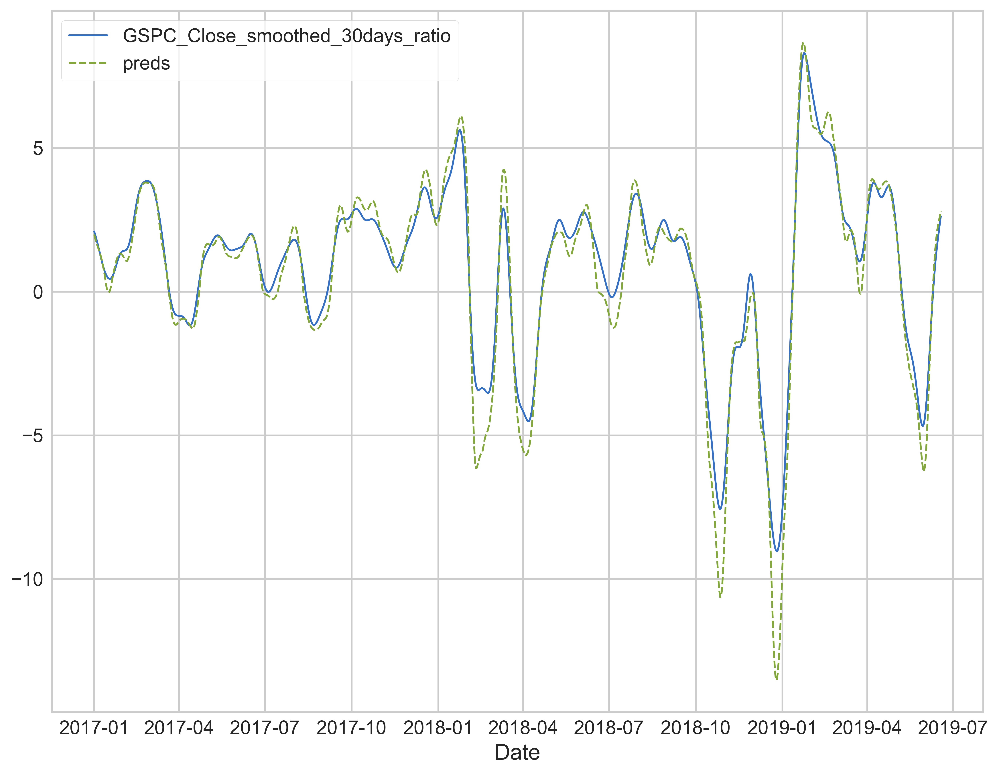

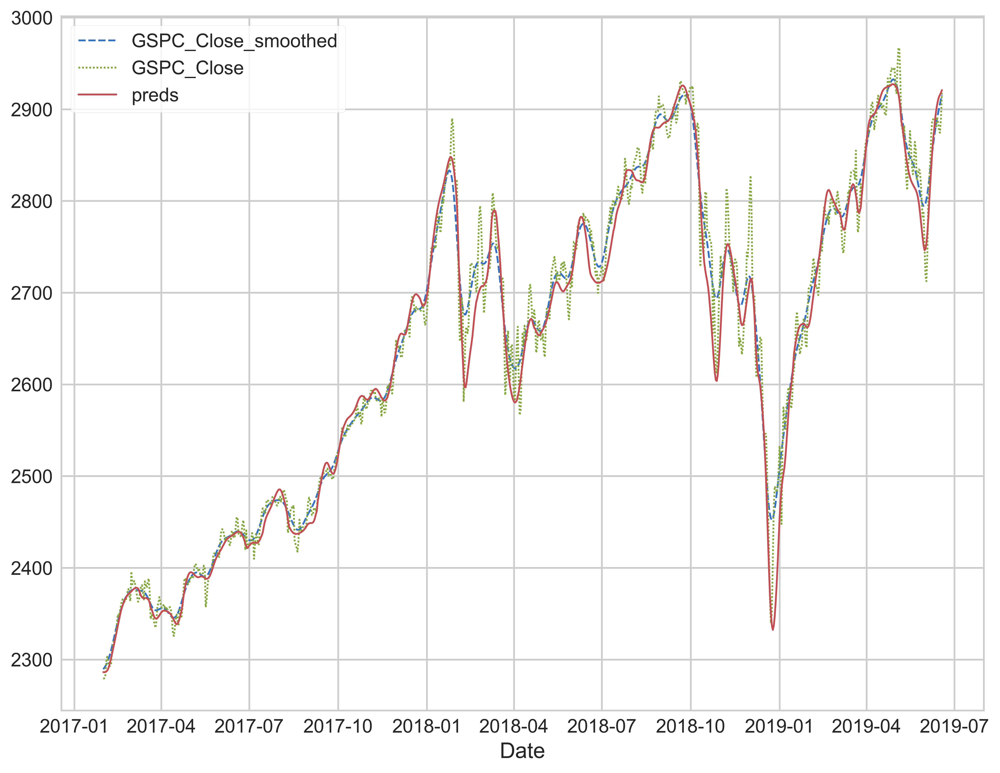

Prediction is 0.0 days behind reference


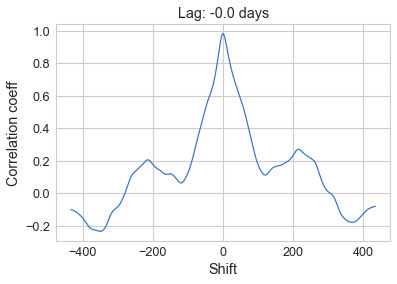


For major peaks in the index:

The average delay around the peaks are -1.211 days
The median delay around the peaks are 0.0 days


,Days Delayed
2017-02-28,4.0
2017-05-05,-4.0
2017-06-06,4.0
2017-07-23,9.0
2017-11-04,-10.0
2017-12-19,1.0
2018-01-24,1.0
2018-03-10,1.0
2018-04-18,0.0
2018-05-16,-1.0


In [29]:
plot_results(cnn_model,test_X_dnn, y_test_dnn, start_time='2017-01-01', end_time='2020-01-03')